In [1]:
import pandas as pd
import os
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300

## 1. Load in data

In [2]:
allSpectra = pd.read_csv('spectra_aggregated.csv')
metadata = pd.read_csv('metadata.csv')

# these are bad splits
metadata_train = pd.read_csv('metadata_train.csv')
metadata_test = pd.read_csv('metadata_test.csv')

allSpectra = allSpectra.T
allSpectra.columns = allSpectra.iloc[0]
allSpectra = allSpectra[1:]
allSpectra.index = allSpectra.index.astype(int)

# genera ending in "osmunda" are ferns
species = metadata.species.unique()
species.sort()
genuses = metadata.genus.unique()
genuses.sort()


In [3]:
orders = metadata.order.unique()
orders.sort()

# standard python color cycle for orders
order_color_dict = {
    'Asterales': '#1f77b4',
    'Fagales': '#ff7f0e',
    'Malpighiales': '#2ca02c',
    'Osmundales': '#d62728',
    'Poales': '#9467bd',
    'Rosales': '#8c564b',
    'Sapindales': '#e377c2'
}

In [4]:
# assign leaf stages
# march-may = juvenile
# june-sept = mature
# october-february = late
month_dict = {
    3: 'juvenile',
    4: 'juvenile',
    5: 'juvenile',
    6: 'mature',
    7: 'mature',
    8: 'mature',
    9: 'mature',
    10: 'late',
    11: 'late',
    12: 'late',
    1: 'late',
    2: 'late'
}

metadata['leaf_stage'] = metadata.month.map(month_dict)

# remove juvenile and late leaves
metadata = metadata[metadata['leaf_stage'] == 'mature']

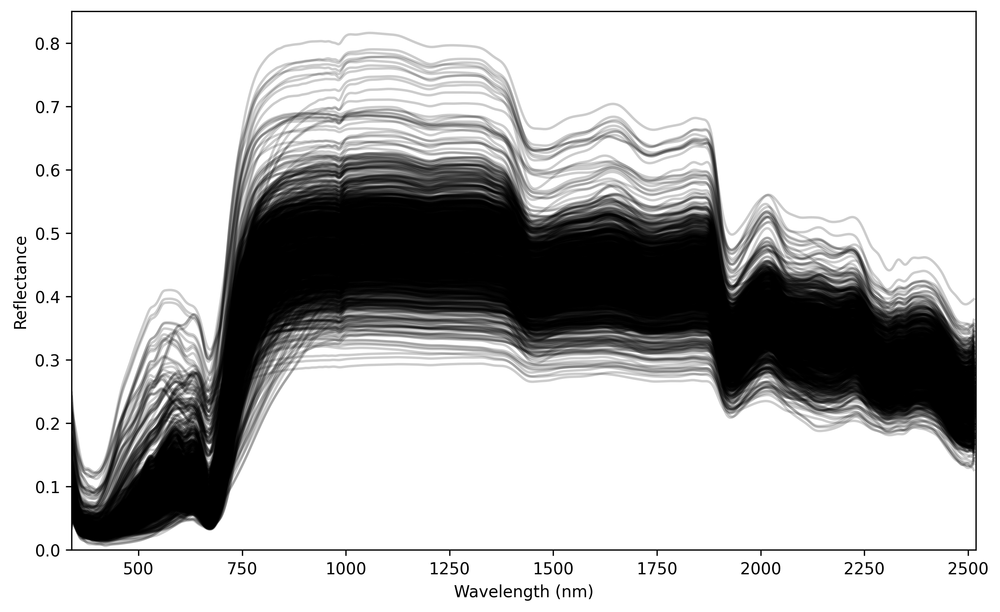

In [5]:
fig, ax = plt.subplots(figsize=(10, 6))

for i in range(len(metadata)):
    filename = metadata.iloc[i]['filename']
    ax.plot(allSpectra[filename], label=filename, alpha=0.2, color='k')

ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Reflectance')
ax.set_xlim(allSpectra.index.min(), allSpectra.index.max())
ax.set_ylim(0,0.85)

plt.show()

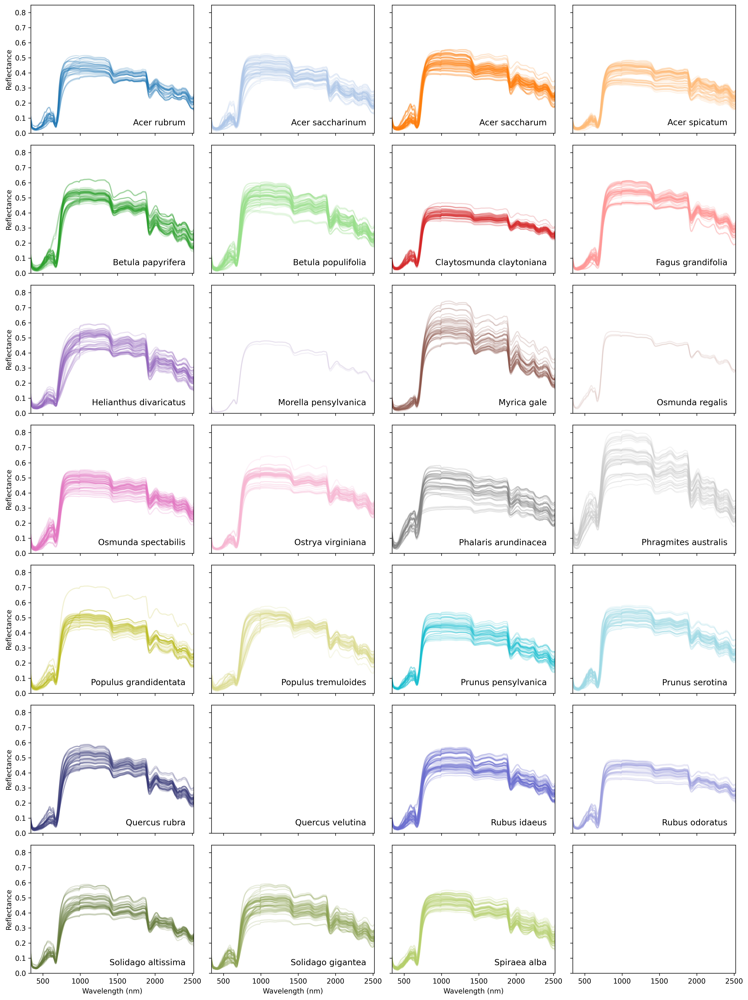

In [6]:
# plot by species
fig, axs = plt.subplots(7, 4, figsize=(15, 20), sharex=True, sharey=True)

# 30 color color cycle
colors = plt.cm.tab20.colors + plt.cm.tab20b.colors + plt.cm.tab20c.colors

# species color dictionary
sp_dict = {}

for sp in species:
    sp_dict[sp] = colors[np.where(species == sp)[0][0] % len(colors)]

for i, sp in enumerate(species):
    these_files = metadata[metadata.species == sp]['filename']
    ax = axs[i // 4, i % 4]
    for filename in these_files:
        ax.plot(allSpectra[filename], label=filename, alpha=0.2, color=colors[i % len(colors)])

    # species name in lower right
    ax.text(0.95, 0.05, sp, transform=ax.transAxes, fontsize=12,
            verticalalignment='bottom', horizontalalignment='right')

    ax.set_xlim(allSpectra.index.min(), allSpectra.index.max())
    ax.set_ylim(0, 0.85)
    if i // 4 == 6:
        ax.set_xlabel('Wavelength (nm)')
    if i % 4 == 0:
        ax.set_ylabel('Reflectance')

plt.tight_layout()
plt.show()


## 2. Calculate spectral separability

In [7]:
# calculate angle between spectra
def calculate_angle(spectrum1, spectrum2):
    # Normalize the spectra
    spectrum1 = spectrum1 / (spectrum1**2).sum()**0.5
    spectrum2 = spectrum2 / (spectrum2**2).sum()**0.5

    # Calculate the dot product
    dot_product = (spectrum1 * spectrum2).sum()

    # Calculate the angle in radians
    angle = np.arccos(dot_product)

    return angle

In [8]:
# build a matrix of spectral separability
sp_sep_mat = np.zeros((len(species), len(species)))

if os.path.exists('spectral_separability_matrix.npy'):
    sp_sep_mat = np.load('spectral_separability_matrix.npy')

In [9]:
for i, sp1 in enumerate(species):
    print('Working on', sp1)
    for j, sp2 in enumerate(species):
        # check if this one is done
        if sp_sep_mat[i, j] != 0:
            continue
        if i == j:
            sp_sep_mat[i, j] = 0
        else:
            # get all spectra for species 1 and species 2
            spec1_files = metadata[metadata.species == sp1]['filename']
            spec2_files = metadata[metadata.species == sp2]['filename']

            # calculate average angle between all pairs of spectra from species 1 and species 2
            angles = []
            for f1 in spec1_files:
                for f2 in spec2_files:
                    spec1_vals = allSpectra[f1].loc[350:2500].values
                    spec2_vals = allSpectra[f2].loc[350:2500].values
                    angle = calculate_angle(spec1_vals, spec2_vals)
                    angles.append(angle)

            sp_sep_mat[i, j] = np.mean(angles)

Working on Acer rubrum
Working on Acer saccharinum
Working on Acer saccharum
Working on Acer spicatum
Working on Betula papyrifera
Working on Betula populifolia
Working on Claytosmunda claytoniana
Working on Fagus grandifolia
Working on Helianthus divaricatus
Working on Morella pensylvanica
Working on Myrica gale
Working on Osmunda regalis
Working on Osmunda spectabilis
Working on Ostrya virginiana
Working on Phalaris arundinacea
Working on Phragmites australis
Working on Populus grandidentata
Working on Populus tremuloides
Working on Prunus pensylvanica
Working on Prunus serotina
Working on Quercus rubra
Working on Quercus velutina
Working on Rubus idaeus
Working on Rubus odoratus
Working on Solidago altissima
Working on Solidago gigantea
Working on Spiraea alba


In [10]:
# save out the matrix as numpy array
np.save('spectral_separability_matrix.npy', sp_sep_mat)


In [11]:
# remove quercus velutina from the spectral separability matrix
q_velutina_index = np.where(species == 'Quercus velutina')[0][0]

sp_sep_mat = np.delete(sp_sep_mat, q_velutina_index, axis=0)
sp_sep_mat = np.delete(sp_sep_mat, q_velutina_index, axis=1)

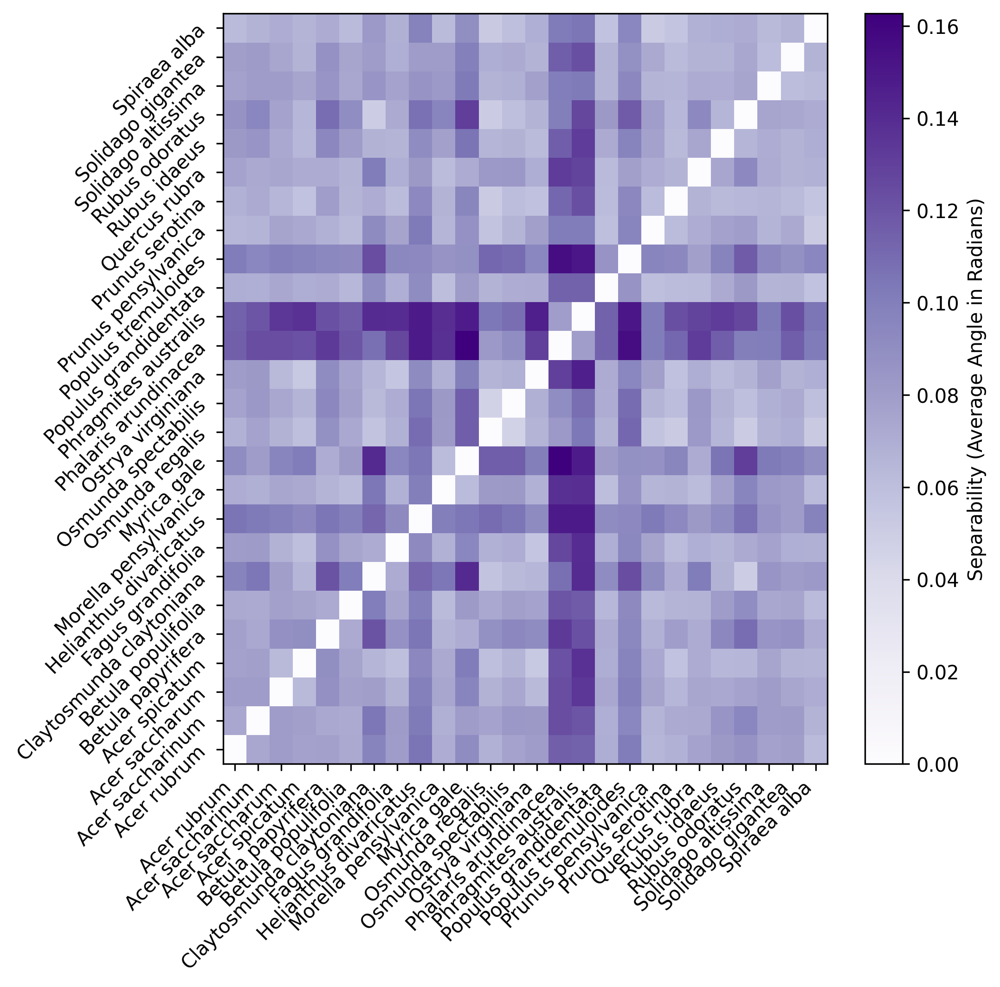

In [12]:
# colormesh of species separability
fig, ax = plt.subplots(figsize=(7,7))

c = ax.pcolormesh(sp_sep_mat, cmap='Purples', shading='auto')

species_no_q_velutina = np.delete(species, q_velutina_index)

# label axes with species names
ax.set_xticks(np.arange(len(species_no_q_velutina)) + 0.5)
ax.set_yticks(np.arange(len(species_no_q_velutina)) + 0.5)
ax.set_xticklabels(species_no_q_velutina, rotation=45, ha='right')
ax.set_yticklabels(species_no_q_velutina, rotation=45, ha='right')

# add colorbar
plt.colorbar(c, ax=ax, label='Separability (Average Angle in Radians)')

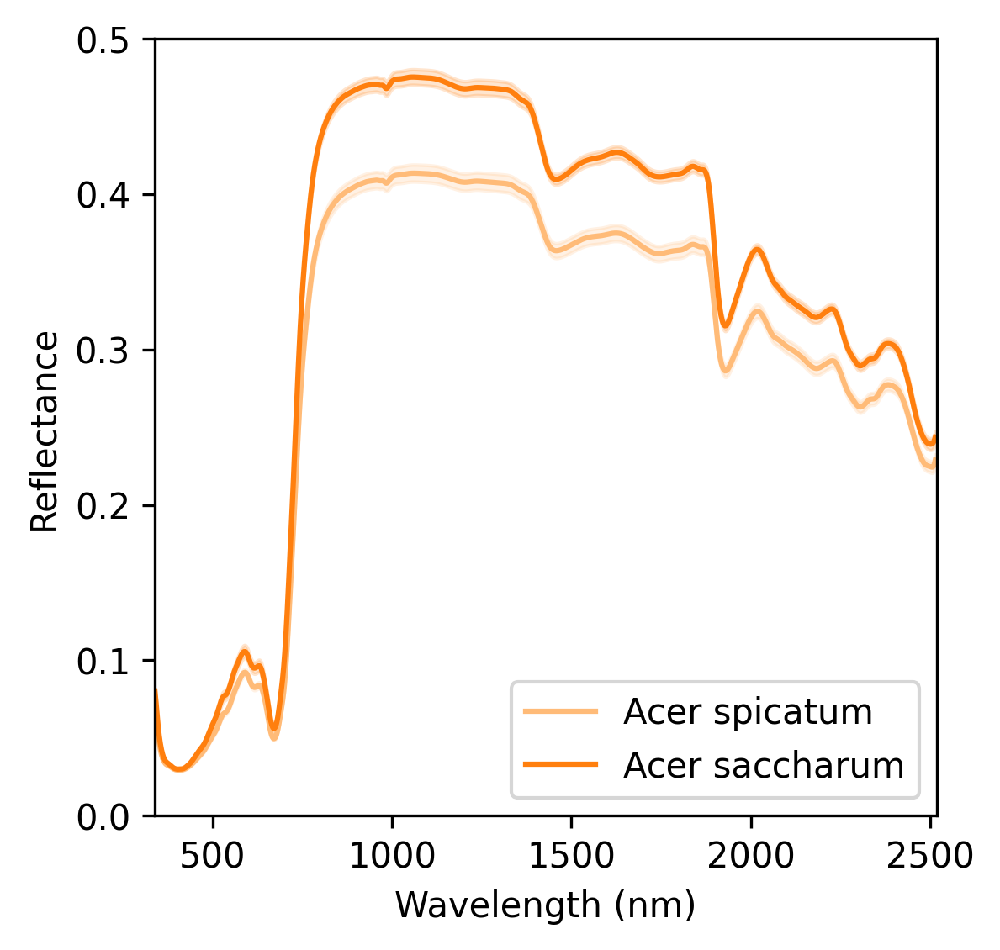

In [13]:
# plot average spectra

sp1 = 'Acer spicatum'
sp2 = 'Acer saccharum'

avg_sp1_spec = allSpectra[metadata[metadata.species == sp1]['filename']].mean(axis=1).dropna()
avg_sp2_spec = allSpectra[metadata[metadata.species == sp2]['filename']].mean(axis=1).dropna()
stderr_sp1_spec = allSpectra[metadata[metadata.species == sp1]['filename']].std(axis=1).dropna() / np.sqrt(len(metadata[metadata.species == sp1]))
stderr_sp2_spec = allSpectra[metadata[metadata.species == sp2]['filename']].std(axis=1).dropna() / np.sqrt(len(metadata[metadata.species == sp2]))

avg_sp1_spec = pd.to_numeric(avg_sp1_spec, errors='coerce'); avg_sp2_spec = pd.to_numeric(avg_sp2_spec, errors='coerce'); stderr_sp1_spec = pd.to_numeric(stderr_sp1_spec, errors='coerce'); stderr_sp2_spec = pd.to_numeric(stderr_sp2_spec, errors='coerce')

fig, ax = plt.subplots(figsize=(4, 4), sharey=True)

ax.plot(avg_sp1_spec, color=sp_dict[sp1], label=sp1)
ax.fill_between(avg_sp1_spec.index, avg_sp1_spec - stderr_sp1_spec, avg_sp1_spec + stderr_sp1_spec, color=sp_dict[sp1], alpha=0.2)

ax.plot(avg_sp2_spec, color=sp_dict[sp2], label=sp2)
ax.fill_between(avg_sp2_spec.index, avg_sp2_spec - stderr_sp2_spec, avg_sp2_spec + stderr_sp2_spec, color=sp_dict[sp2], alpha=0.2)

ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Reflectance')
ax.set_xlim(allSpectra.index.min(), allSpectra.index.max())
ax.set_ylim(0, 0.5)

ax.legend(loc='lower right')

## 3. LDA

In [14]:
# linear discriminant analysis
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# subset spectra to 400-2400, every 5 nm
wavelengths = np.arange(400, 2401, 5)

In [15]:
# loop over 50 iterations
all_specimen_ids = metadata['specimenId'].unique()
num_iter = 50

conf_matrices = np.zeros((num_iter, len(species), len(species)))
ld_coeffs = []

for i in range(num_iter):
    # set seed
    np.random.seed(i)

    lda = LinearDiscriminantAnalysis()

    train_ids = np.random.choice(all_specimen_ids, size=int(len(all_specimen_ids) * 0.8), replace=False)
    metadata_train = metadata[metadata['specimenId'].isin(train_ids)]
    metadata_test = metadata[~metadata['specimenId'].isin(train_ids)]

    spec_train = allSpectra.loc[wavelengths, metadata_train['filename']].T
    spec_test = allSpectra.loc[wavelengths, metadata_test['filename']].T

    lda.fit(spec_train, metadata_train['species'])

    y_pred = lda.predict(spec_test)
    y_true = metadata_test['species']

    # create confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred, labels=species)
    conf_matrices[i] = conf_matrix

    # extract coefficients
    coeffs = lda.coef_
    ld_coeffs.append(coeffs)

In [16]:
def apply_ld(spec, ld_idx, coeffs_idx):
    these_coeffs = ld_coeffs[coeffs_idx][ld_idx]
    return np.dot(spec, these_coeffs)

In [17]:
# species color dictionary
sp_dict = {}

for sp in species:
    sp_dict[sp] = colors[np.where(species == sp)[0][0] % len(colors)]

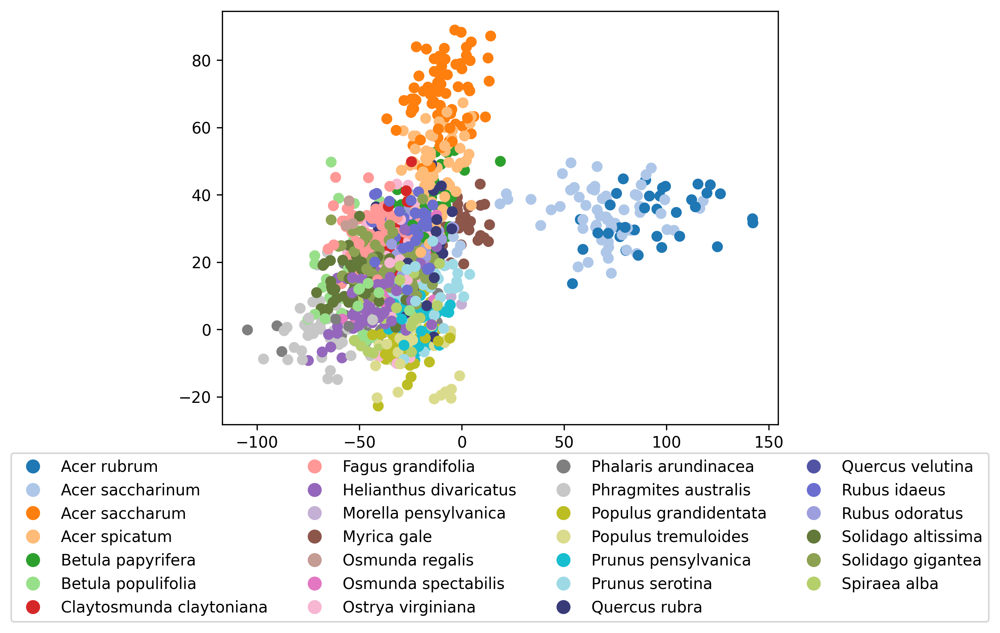

In [18]:
ld1_idx = 0
ld2_idx = 2

# plot score for ld1 for all spectra
for filename in metadata['filename']:
    spec_vals = allSpectra[filename].loc[wavelengths].values
    ld1_score = apply_ld(spec_vals, ld1_idx, 0)
    ld2_score = apply_ld(spec_vals, ld2_idx, 0)
    plt.scatter(ld1_score, ld2_score, color=sp_dict[metadata[metadata['filename'] == filename]['species'].values[0]])

# add legend below 
plt.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', label=sp, markersize=10, markerfacecolor=sp_dict[sp]) for sp in species],
           bbox_to_anchor=(0.5, -0.05), loc='upper center', ncol=4)

In [19]:
# calculate ld scores for all LDs, all spectra
ld_scores = np.zeros((len(metadata), len(ld_coeffs[0])))

for i in range(len(metadata)):
    spec_vals = allSpectra[metadata.iloc[i]['filename']].loc[wavelengths].values
    for ld_idx in range(len(ld_coeffs[0])):
        ld_scores[i, ld_idx] = apply_ld(spec_vals, ld_idx, 0)

ld_scores.shape

(1330, 26)

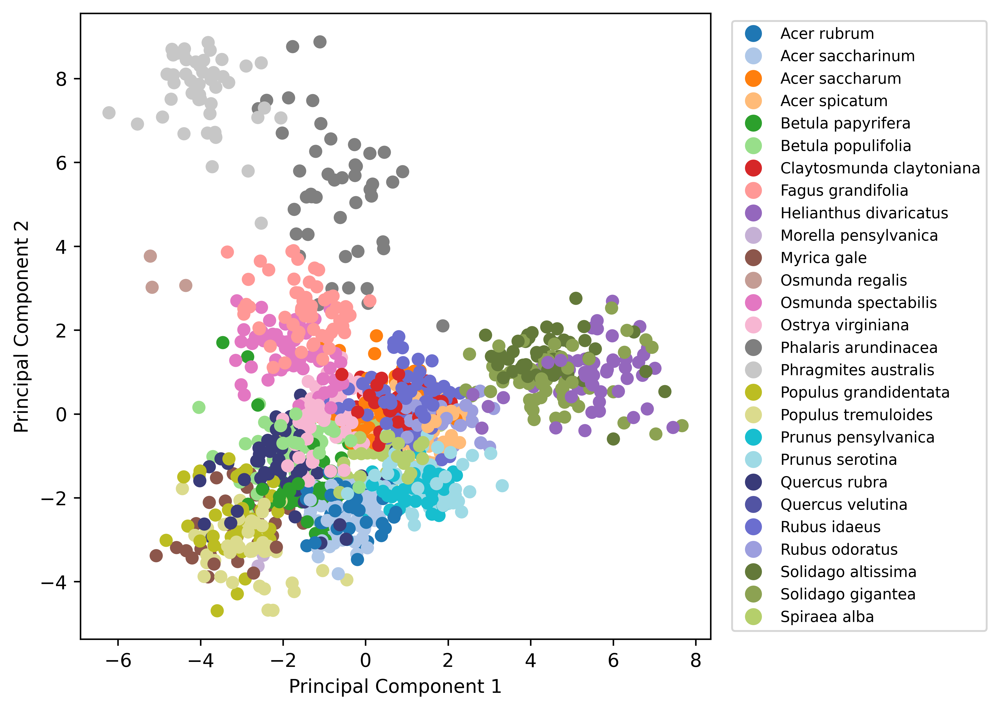

In [ ]:
# principal components analysis of LD scores
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# scale coefficients before PCA
scaler = StandardScaler()
ld_scores_scaled = scaler.fit_transform(pd.DataFrame(ld_scores))
pca = PCA(n_components=26)
pca_features = pca.fit_transform(ld_scores_scaled)

fig, ax = plt.subplots(figsize=(6, 6))

for i, point in enumerate(pca_features):
    sp = metadata['species'].iloc[i]
    order = metadata['order'].iloc[i]
    ax.scatter(point[0], point[1], color=sp_dict[sp])

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')

legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=species, markersize=10, markerfacecolor=color) for species, color in sp_dict.items()]
ax.legend(handles=legend_elements, bbox_to_anchor=(1.45, 1), loc='upper right', fontsize=8)

(0.0, 1.0)

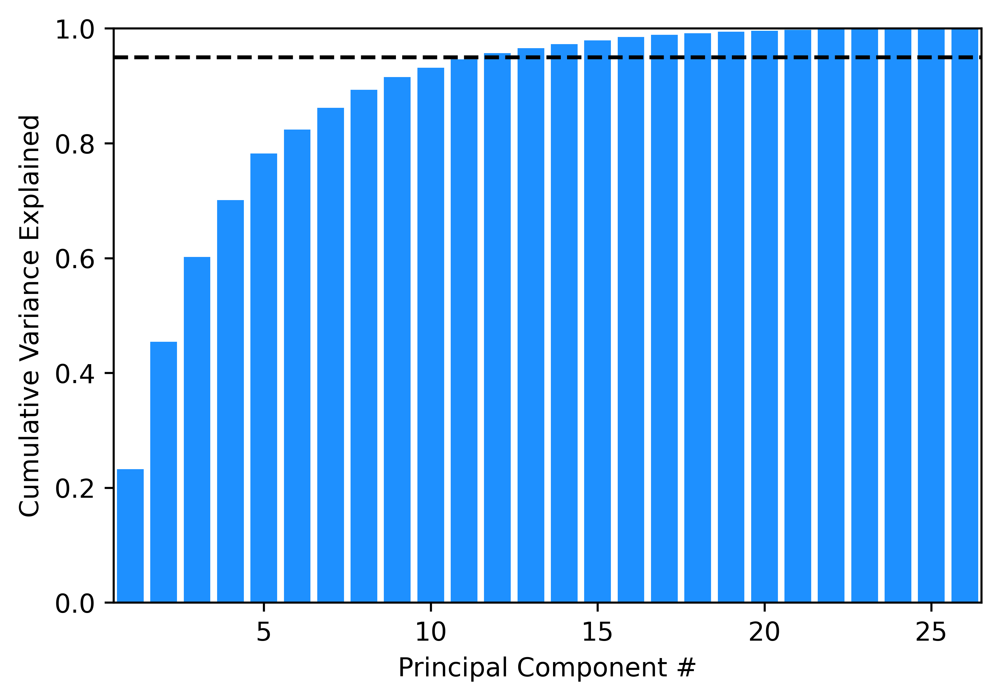

In [ ]:
# variance explained by each principal component
fig, ax = plt.subplots(figsize=(6, 4))

# cumulative variance explained by each principal component
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

# plot cumulative variance explained
ax.bar(np.arange(len(cumulative_variance))+1, cumulative_variance, color='dodgerblue')
ax.axhline(y=0.95, color='k', linestyle='--', label='95% Variance Explained')

ax.set_xlabel('Principal Component #')
ax.set_ylabel('Cumulative Variance Explained')
ax.set_xlim([0.5, len(cumulative_variance)+0.5])
ax.set_ylim([0, 1])

In [ ]:
import pandas as pd
import os
import numpy as np

import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 600

## 1. Load in data

In [ ]:
allSpectra = pd.read_csv('spectra_aggregated.csv')
metadata = pd.read_csv('metadata.csv')

# these are bad splits
metadata_train = pd.read_csv('metadata_train.csv')
metadata_test = pd.read_csv('metadata_test.csv')

allSpectra = allSpectra.T
allSpectra.columns = allSpectra.iloc[0]
allSpectra = allSpectra[1:]
allSpectra.index = allSpectra.index.astype(int)

# genera ending in "osmunda" are ferns
species = metadata.species.unique()
species.sort()
genuses = metadata.genus.unique()
genuses.sort()

In [ ]:
# assign leaf stages
# march-may = juvenile
# june-sept = mature
# october-february = late
month_dict = {
    3: 'juvenile',
    4: 'juvenile',
    5: 'juvenile',
    6: 'mature',
    7: 'mature',
    8: 'mature',
    9: 'mature',
    10: 'late',
    11: 'late',
    12: 'late',
    1: 'late',
    2: 'late'
}

metadata['leaf_stage'] = metadata.month.map(month_dict)

# remove juvenile and late leaves
metadata = metadata[metadata['leaf_stage'] == 'mature']

In [ ]:
# save out LD scores
ld_scores_columnnames = ['LD' + str(i+1) for i in range(len(ld_coeffs[0]))]
ld_scores = pd.DataFrame(columns=['filename', 'species'] + ld_scores_columnnames)

for i, filename in enumerate(metadata['filename']):
    spec_vals = allSpectra[filename].loc[wavelengths].values
    ld_scores_row = {'filename': filename, 'species': metadata[metadata['filename'] == filename]['species'].values[0]}
    for i in range(len(ld_coeffs[0])):
        ld_scores_row['LD' + str(i+1)] = apply_ld(spec_vals, i, 0)
    ld_scores = pd.concat([ld_scores, pd.DataFrame([ld_scores_row])], ignore_index=True)

# save out ld_scores
# ld_scores.to_csv('ld_scores_rawspec.csv', index=False)

C:\Users\jeant\AppData\Local\Temp\ipykernel_32212\359984160.py:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  ld_scores = pd.concat([ld_scores, pd.DataFrame([ld_scores_row])], ignore_index=True)


Text(0, 0.5, 'True Species')

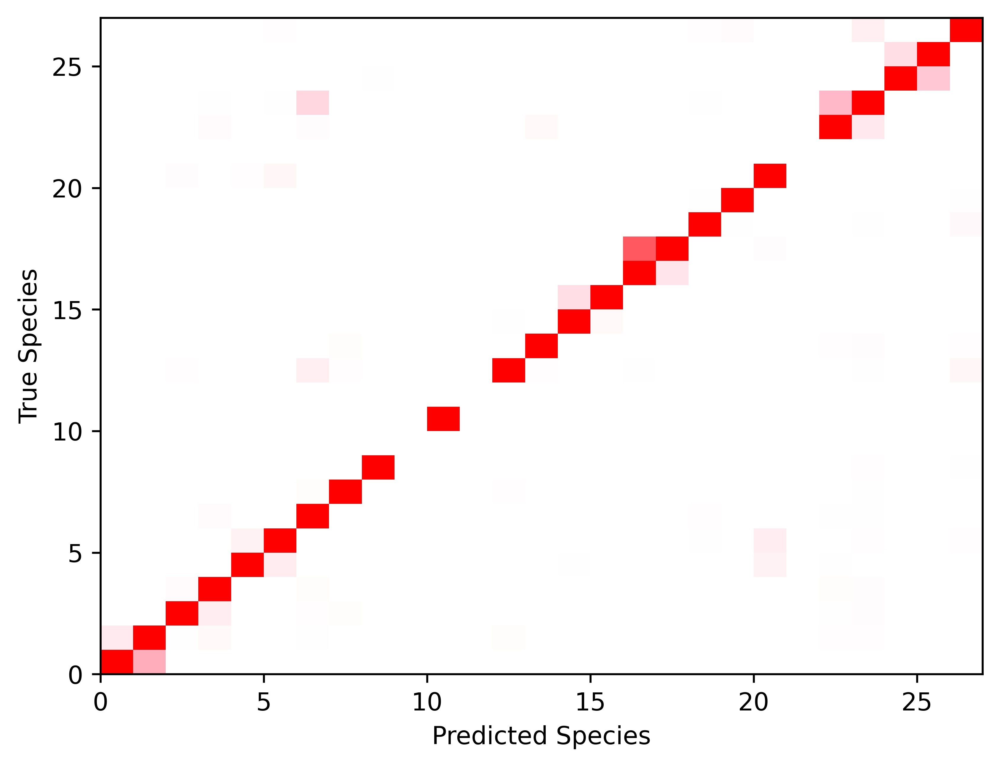

In [ ]:
# plot average confusion matrix

# custom colorbar
my_cmap = plt.cm.colors.LinearSegmentedColormap.from_list("custom", ["#FFFFFF", "#FFB5C5", "#FF0000"])

# make conf matrix with % correct predictions
this_conf_matrix = np.zeros((len(species), len(species)))
for i in range(len(species)):
    num_true = conf_matrices[:, i, i].sum()
    for j in range(len(species)):
        this_conf_matrix[i, j] = conf_matrices[:, i, j].sum() / num_true if num_true > 0 else 0

avg_conf_matrix = np.mean(this_conf_matrix, axis=0)
plt.pcolormesh(this_conf_matrix, cmap=my_cmap)
plt.xlabel('Predicted Species')
plt.ylabel('True Species')

C:\Users\jeant\AppData\Local\Temp\ipykernel_32212\2041027393.py:7: RuntimeWarning: invalid value encountered in scalar divide
  misclassified = num_this_species_pred_as_other / num_this_species_true


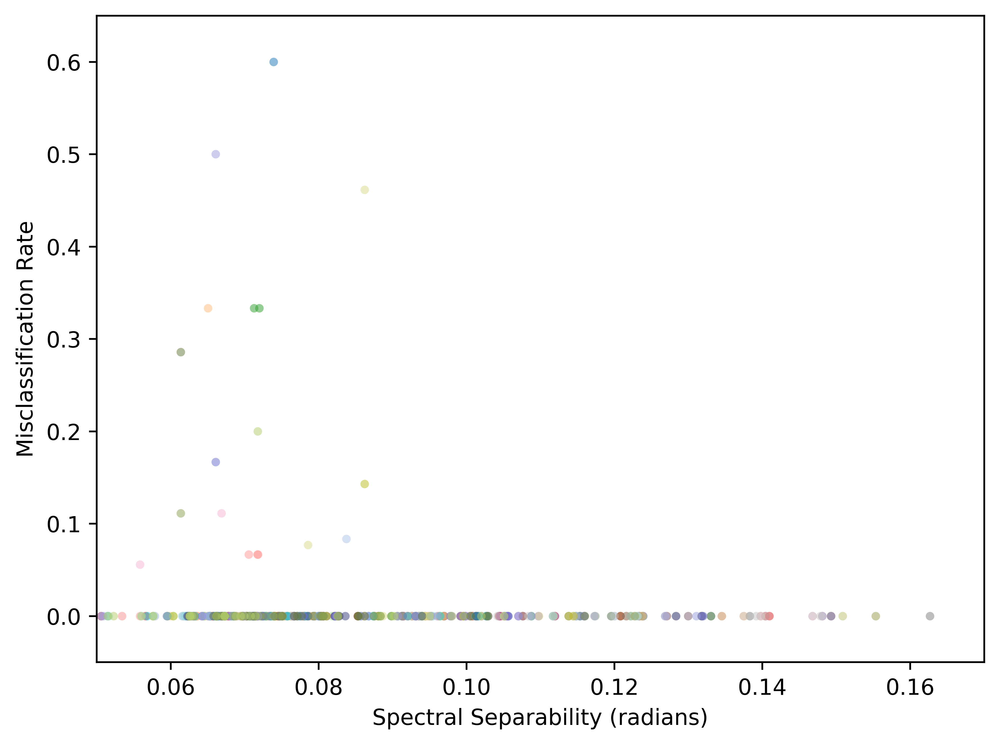

In [ ]:
# plot % of misclassified spectra vs. spectral separability of that combination
for i in range(len(species)):
    for j in range(len(species)):
        if i != j:
            num_this_species_true = np.sum(metadata_test['species'] == species[i])
            num_this_species_pred_as_other = np.sum((metadata_test['species'] == species[i]) & (y_pred == species[j]))
            misclassified = num_this_species_pred_as_other / num_this_species_true
            plt.scatter(sp_sep_mat[i, j], misclassified, color=sp_dict[species[i]], label=species[i] + ' labeled as ' + species[j], s=15, alpha=0.5, linewidth=0)


plt.xlabel('Spectral Separability (radians)')
plt.ylabel('Misclassification Rate')
plt.ylim(-0.05, 0.65)
plt.xlim(0.05, 0.17)

plt.tight_layout()
plt.show()

Average accuracy over 50 iterations: 0.8431 std. 0.030320011221268678


Text(0, 0.5, 'Frequency')

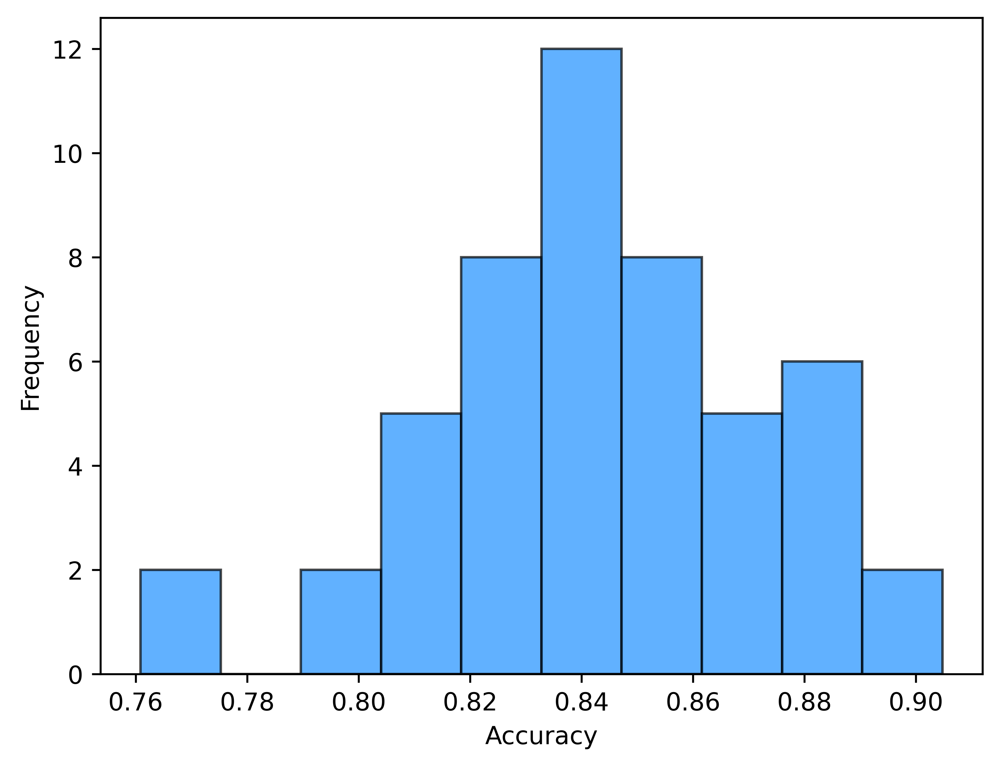

In [ ]:
# print average accuracy
accuracies = []
for i in range(num_iter):
    accuracy = np.trace(conf_matrices[i]) / np.sum(conf_matrices[i])
    accuracies.append(accuracy)

print(f'Average accuracy over {num_iter} iterations: {np.mean(accuracies):.4f}', 'std.', np.std(accuracies))

# histogram of accuracies
plt.hist(accuracies, bins=10, color='dodgerblue', alpha=0.7, linewidth=1, edgecolor='black')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')


## 3.5 Separate LDA runs by wavelength region

In [ ]:
# @jean

## 4. Try vector normalization

In [ ]:
# brightness normalize spectra
def norm_spec(spec):
    spec_sum = np.sum(spec)
    return spec / spec_sum

allSpectra_norm = allSpectra.apply(norm_spec, axis=0)

In [ ]:
# do it all again!
conf_matrices_normed = np.zeros((num_iter, len(species), len(species)))
ld_coeffs_normed = []

for i in range(num_iter):
    # set seed
    np.random.seed(i)

    lda = LinearDiscriminantAnalysis()

    train_ids = np.random.choice(all_specimen_ids, size=int(len(all_specimen_ids) * 0.8), replace=False)
    metadata_train = metadata[metadata['specimenId'].isin(train_ids)]
    metadata_test = metadata[~metadata['specimenId'].isin(train_ids)]

    spec_train = allSpectra_norm.loc[wavelengths, metadata_train['filename']].T
    spec_test = allSpectra_norm.loc[wavelengths, metadata_test['filename']].T

    lda.fit(spec_train, metadata_train['species'])

    y_pred = lda.predict(spec_test)
    y_true = metadata_test['species']

    # create confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred, labels=species)
    conf_matrices_normed[i] = conf_matrix

    # extract coefficients
    coeffs = lda.coef_
    ld_coeffs_normed.append(coeffs)

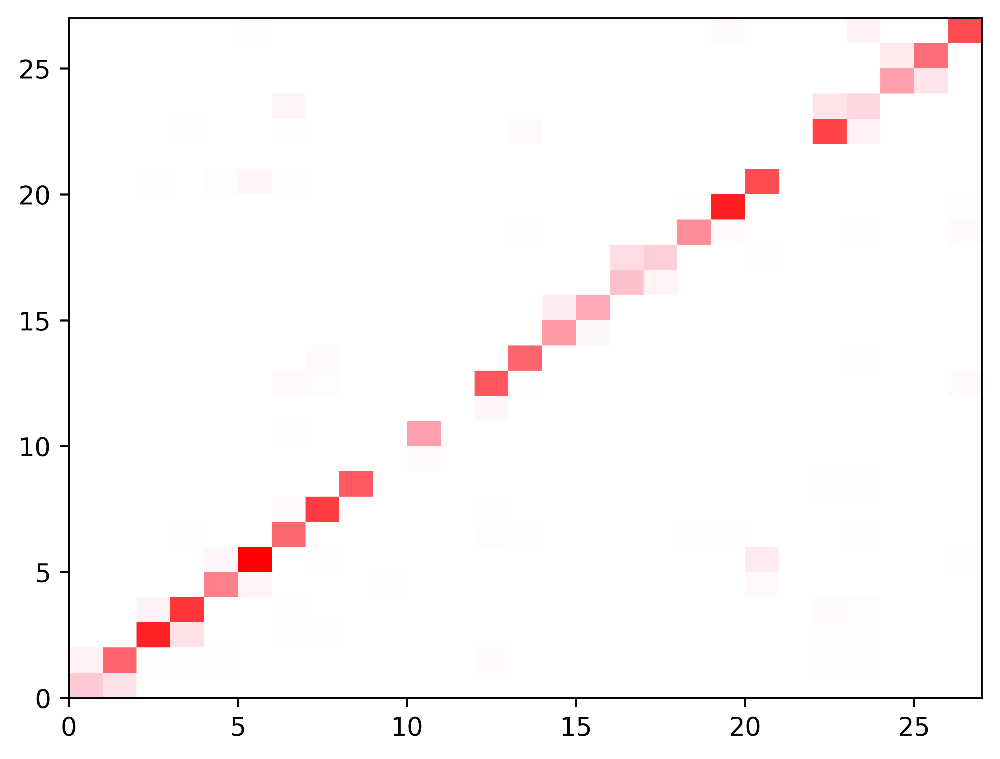

In [ ]:
# plot average confusion matrix
avg_conf_matrix = np.mean(conf_matrices_normed, axis=0)
plt.pcolormesh(avg_conf_matrix, cmap=my_cmap)

Average accuracy over 50 iterations: 0.8368 std. 0.029064188238684275


Text(0, 0.5, 'Frequency')

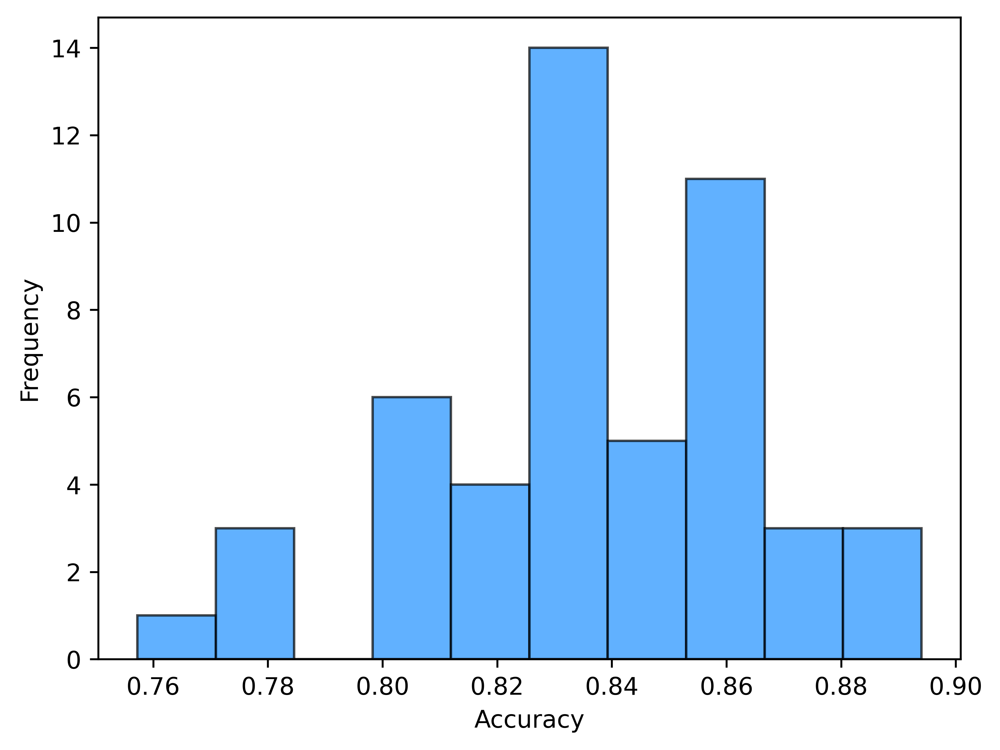

In [ ]:
# print average accuracy
accuracies = []
for i in range(num_iter):
    accuracy = np.trace(conf_matrices_normed[i]) / np.sum(conf_matrices_normed[i])
    accuracies.append(accuracy)

print(f'Average accuracy over {num_iter} iterations: {np.mean(accuracies):.4f}', 'std.', np.std(accuracies))

# histogram of accuracies
plt.hist(accuracies, bins=10, color='dodgerblue', alpha=0.7, linewidth=1, edgecolor='black')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')


## 5. Try derivatives...

In [ ]:
# now with the first and second derivitives
allSpectra_deriv1 = allSpectra.diff().fillna(0)
allSpectra_deriv2 = allSpectra_deriv1.diff().fillna(0)

C:\Users\jeant\AppData\Local\Temp\ipykernel_32212\1536122828.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  allSpectra_deriv1 = allSpectra.diff().fillna(0)


In [ ]:
# fit the LDA models
conf_matrices_deriv1 = np.zeros((num_iter, len(species), len(species)))
conf_matrices_deriv2 = np.zeros((num_iter, len(species), len(species)))
ld_coeffs_deriv1 = []
ld_coeffs_deriv2 = []

for i in range(num_iter):
    # set seed
    np.random.seed(i)

    lda = LinearDiscriminantAnalysis()

    train_ids = np.random.choice(all_specimen_ids, size=int(len(all_specimen_ids) * 0.8), replace=False)
    metadata_train = metadata[metadata['specimenId'].isin(train_ids)]
    metadata_test = metadata[~metadata['specimenId'].isin(train_ids)]

    spec_train_deriv1 = allSpectra_deriv1.loc[wavelengths, metadata_train['filename']].T
    spec_train_deriv2 = allSpectra_deriv2.loc[wavelengths, metadata_train['filename']].T
    spec_test_deriv1 = allSpectra_deriv1.loc[wavelengths, metadata_test['filename']].T
    spec_test_deriv2 = allSpectra_deriv2.loc[wavelengths, metadata_test['filename']].T

    # deriv 1
    lda.fit(spec_train_deriv1, metadata_train['species'])
    y_pred = lda.predict(spec_test_deriv1)
    y_true = metadata_test['species']
    # create confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred, labels=species)
    conf_matrices_deriv1[i] = conf_matrix

    # extract coefficients
    coeffs = lda.coef_
    ld_coeffs_deriv1.append(coeffs)

    # deriv 2
    lda.fit(spec_train_deriv2, metadata_train['species'])
    y_pred = lda.predict(spec_test_deriv2)
    y_true = metadata_test['species']
    # create confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred, labels=species)
    conf_matrices_deriv2[i] = conf_matrix

    # extract coefficients
    coeffs = lda.coef_
    ld_coeffs_deriv2.append(coeffs)

Text(0, 0.5, 'Frequency')

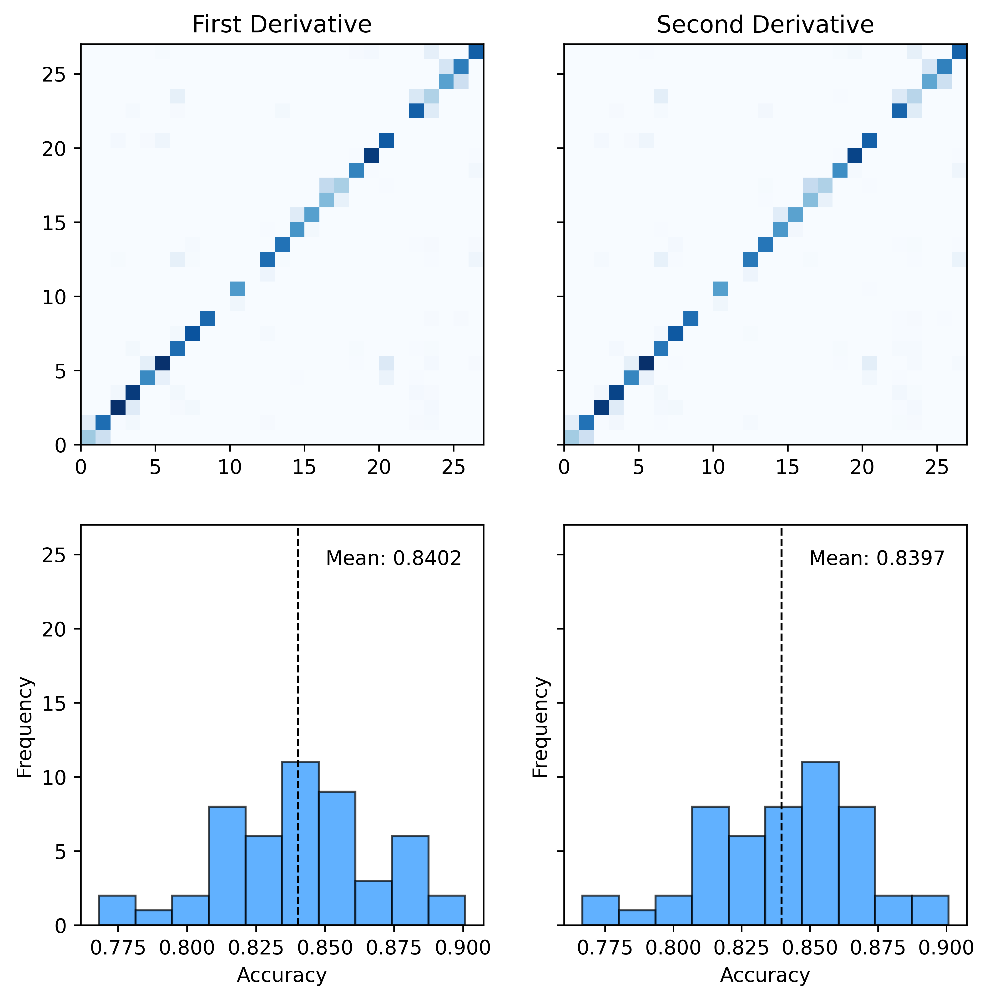

In [ ]:
# first deriv
fig, axs = plt.subplots(2, 2, figsize=(8,8), sharey=True)

axs[0, 0].pcolormesh(np.mean(conf_matrices_deriv1, axis=0), cmap='Blues')
axs[0, 0].set_title('First Derivative')

axs[0, 1].pcolormesh(np.mean(conf_matrices_deriv2, axis=0), cmap='Blues')
axs[0, 1].set_title('Second Derivative')

accuracies = []
for i in range(num_iter):
    accuracy = np.trace(conf_matrices_deriv1[i]) / np.sum(conf_matrices_deriv1[i])
    accuracies.append(accuracy)
mean_accuracy = np.mean(accuracies)
axs[1, 0].hist(accuracies, bins=10, color='dodgerblue', alpha=0.7, linewidth=1, edgecolor='black')
axs[1, 0].axvline(mean_accuracy, color='k', linestyle='dashed', linewidth=1)
axs[1, 0].text(mean_accuracy + 0.01, axs[1, 0].get_ylim()[1] * 0.9, f'Mean: {mean_accuracy:.4f}', color='k')
axs[1, 0].set_xlabel('Accuracy')
axs[1, 0].set_ylabel('Frequency')

accuracies = []
for i in range(num_iter):
    accuracy = np.trace(conf_matrices_deriv2[i]) / np.sum(conf_matrices_deriv2[i])
    accuracies.append(accuracy)
mean_accuracy = np.mean(accuracies)
axs[1, 1].hist(accuracies, bins=10, color='dodgerblue', alpha=0.7, linewidth=1, edgecolor='black')
axs[1, 1].axvline(mean_accuracy, color='k', linestyle='dashed', linewidth=1)
axs[1, 1].text(mean_accuracy + 0.01, axs[1, 1].get_ylim()[1] * 0.9, f'Mean: {mean_accuracy:.4f}', color='k')
axs[1, 1].set_xlabel('Accuracy')
axs[1, 1].set_ylabel('Frequency')

## 6. Neural net?

In [ ]:
# let's try a neural network
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler

mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=1000, random_state=42)

scaler = StandardScaler()

X_train = allSpectra_norm.loc[wavelengths, metadata_train['filename']].T
X_train_scaled = scaler.fit_transform(X_train)
X_test = allSpectra_norm.loc[wavelengths, metadata_test['filename']].T
X_test_scaled = scaler.transform(X_test)

mlp.fit(X_train_scaled, metadata_train['species'])

,"max_iter max_iter: int, default=200Maximum number of iterations. The solver iterates until convergence(determined by 'tol') or this number of iterations. For stochasticsolvers ('sgd', 'adam'), note that this determines the number of epochs(how many times each data point will be used), not the number ofgradient steps.",1000
,"random_state random_state: int, RandomState instance, default=NoneDetermines random number generation for weights and biasinitialization, train-test split if early stopping is used, and batchsampling when solver='sgd' or 'adam'.Pass an int for reproducible results across multiple function calls.See :term:`Glossary <random_state>`.",42
,"hidden_layer_sizes hidden_layer_sizes: array-like of shape(n_layers - 2,), default=(100,)The ith element represents the number of neurons in the ithhidden layer.","(100,)"
,"activation activation: {'identity', 'logistic', 'tanh', 'relu'}, default='relu'Activation function for the hidden layer.- 'identity', no-op activation, useful to implement linear bottleneck, returns f(x) = x- 'logistic', the logistic sigmoid function, returns f(x) = 1 / (1 + exp(-x)).- 'tanh', the hyperbolic tan function, returns f(x) = tanh(x).- 'relu', the rectified linear unit function, returns f(x) = max(0, x)",'relu'
,"solver solver: {'lbfgs', 'sgd', 'adam'}, default='adam'The solver for weight optimization.- 'lbfgs' is an optimizer in the family of quasi-Newton methods.- 'sgd' refers to stochastic gradient descent.- 'adam' refers to a stochastic gradient-based optimizer proposed by Kingma, Diederik, and Jimmy BaFor a comparison between Adam optimizer and SGD, see:ref:`sphx_glr_auto_examples_neural_networks_plot_mlp_training_curves.py`.Note: The default solver 'adam' works pretty well on relativelylarge datasets (with thousands of training samples or more) in terms ofboth training time and validation score.For small datasets, however, 'lbfgs' can converge faster and performbetter.",'adam'
,"alpha alpha: float, default=0.0001Strength of the L2 regularization term. The L2 regularization termis divided by the sample size when added to the loss.For an example usage and visualization of varying regularization, see:ref:`sphx_glr_auto_examples_neural_networks_plot_mlp_alpha.py`.",0.0001
,"batch_size batch_size: int, default='auto'Size of minibatches for stochastic optimizers.If the solver is 'lbfgs', the classifier will not use minibatch.When set to ""auto"", `batch_size=min(200, n_samples)`.",'auto'
,"learning_rate learning_rate: {'constant', 'invscaling', 'adaptive'}, default='constant'Learning rate schedule for weight updates.- 'constant' is a constant learning rate given by 'learning_rate_init'.- 'invscaling' gradually decreases the learning rate at each time step 't' using an inverse scaling exponent of 'power_t'. effective_learning_rate = learning_rate_init / pow(t, power_t)- 'adaptive' keeps the learning rate constant to 'learning_rate_init' as long as training loss keeps decreasing. Each time two consecutive epochs fail to decrease training loss by at least tol, or fail to increase validation score by at least tol if 'early_stopping' is on, the current learning rate is divided by 5.Only used when ``solver='sgd'``.",'constant'
,"learning_rate_init learning_rate_init: float, default=0.001The initial learning rate used. It controls the step-sizein updating the weights. Only used when solver='sgd' or 'adam'.",0.001
,"power_t power_t: float, default=0.5The exponent for inverse scaling learning rate.It is used in updating effective learning rate when the learning_rateis set to 'invscaling'. Only used when solver='sgd'.",0.5
,"shuffle shuffle: bool, default=TrueWhether to shuffle samples in each iteration. Only used whensolver='sgd' or 'adam'.",True


In [ ]:
y_test = metadata_test['species']
y_pred = mlp.predict(X_test_scaled)
accuracy = mlp.score(X_test_scaled, y_test)
print(f"Test Accuracy: {accuracy * 100:.2f}%")

Test Accuracy: 61.36%


In [ ]:
# test hyperparameters
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (150,), (100, 50), (50, 25)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive'],
    'learning_rate_init': [0.001, 0.01, 0.1],
}

random_search = RandomizedSearchCV(
    mlp, param_distributions=param_dist, n_iter=20, cv=5, verbose=2, random_state=42, n_jobs=-1
)

random_search.fit(X_train_scaled, metadata_train['species'])

print("Best parameters found: ", random_search.best_params_)

best_model = random_search.best_estimator_
test_accuracy = best_model.score(X_test_scaled, y_test)
print(f"\nFinal Test Set Accuracy: {test_accuracy * 100:.2f}%")

C:\Users\jeant\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_split.py:812: UserWarning: The least populated class in y has only 3 members, which is less than n_splits=5.
  warnings.warn(


Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters found:  {'solver': 'adam', 'learning_rate_init': 0.001, 'learning_rate': 'adaptive', 'hidden_layer_sizes': (100,), 'alpha': 0.01, 'activation': 'tanh'}

Final Test Set Accuracy: 65.91%


In [ ]:
# 50 iterations of best model
